## Imports & inital settings

In [1]:
import torch
import numpy as np
import random
import wandb
from IPython.display import Markdown
from utils.preprocessing import preprocess_data, CustomDataset, collate_fn, BATCH_SIZE

DF_PATH = "merged_annuale_meteo.csv"
ISDAY_PATH = "sunriseset.csv"
SEED = 46209

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

## Dataset Preprocessing

In [ ]:
processed_data = preprocess_data(DF_PATH, ISDAY_PATH)

In [ ]:
df = processed_data["df"].copy()
media_prod_giornaliera = processed_data['media']

In [ ]:
display(Markdown(f"### Media Produzione Giornaliera: _{round(media_prod_giornaliera, 2)} kW/h_"))

## Model Setup

In [ ]:
from utils.nnmodel import ModelManager

In [ ]:
run = wandb.init(
    project="interpolation",
    name="Giga Recurrent Random Unbounded Network (15 Min) ➿",
    config={
        "learning_rate": 0.001,
        "architecture": "GRRUNH",
        "dataset": "RofiloAnnuale-FullCyclingEncoding",
        "epochs": 100,
        "batch_size": BATCH_SIZE, #10
        "window_size": 1,
        "target_size": 1,
        "seed": SEED,
    },
    notes="Train con Dataset Originale. No BUCHI TotalEnergy, NUOVO MODO DI DIVIDERE IL CODICE",
)

In [7]:
mm = ModelManager(run, name="GRRUN15MIN-TEST2")

Using cuda device
NeuralNetwork(
  (input_before): GRU(48, 32, batch_first=True)
  (input_after): GRU(48, 32, batch_first=True)
  (flat): Flatten(start_dim=1, end_dim=-1)
  (linear1_2): Linear(in_features=64, out_features=128, bias=True)
  (linear2_2): Linear(in_features=128, out_features=128, bias=True)
  (loopGru): GRU(18, 128, batch_first=True)
  (output_layer): Linear(in_features=128, out_features=1, bias=True)
)
Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0
)


## Training

In [8]:
train_df, val_df, test_df, train_scaler, train_target_scaler = processed_data['datasets']['test 2'].copy()

  0%|          | 0/100 [00:00<?, ?epoch/s]

Epoch 01/100 | Train Loss 0.050 | Val Loss 0.065
	Saving model (improve loss) 1000000.0 -> 0.06533830612897873
Epoch 02/100 | Train Loss 0.043 | Val Loss 0.050
	Saving model (improve loss) 0.06533830612897873 -> 0.04986114799976349
Epoch 03/100 | Train Loss 0.036 | Val Loss 0.050
Epoch 04/100 | Train Loss 0.038 | Val Loss 0.048
	Saving model (improve loss) 0.04986114799976349 -> 0.04809838533401489
Epoch 05/100 | Train Loss 0.029 | Val Loss 0.043
	Saving model (improve loss) 0.04809838533401489 -> 0.04312099143862724
Epoch 06/100 | Train Loss 0.031 | Val Loss 0.041
	Saving model (improve loss) 0.04312099143862724 -> 0.04078800603747368
Epoch 07/100 | Train Loss 0.025 | Val Loss 0.040
	Saving model (improve loss) 0.04078800603747368 -> 0.04034453630447388
Epoch 08/100 | Train Loss 0.040 | Val Loss 0.036
	Saving model (improve loss) 0.04034453630447388 -> 0.036230191588401794
Epoch 09/100 | Train Loss 0.023 | Val Loss 0.035
	Saving model (improve loss) 0.036230191588401794 -> 0.035035904

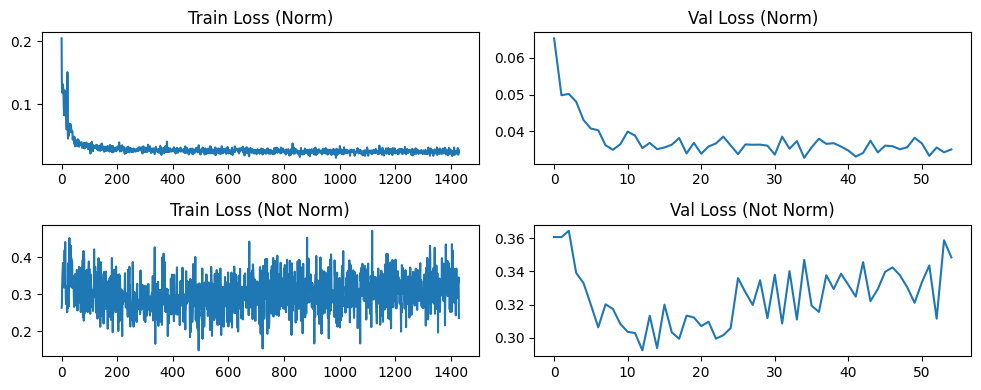

In [9]:
mm.train(train_df, val_df)

## Evaluation

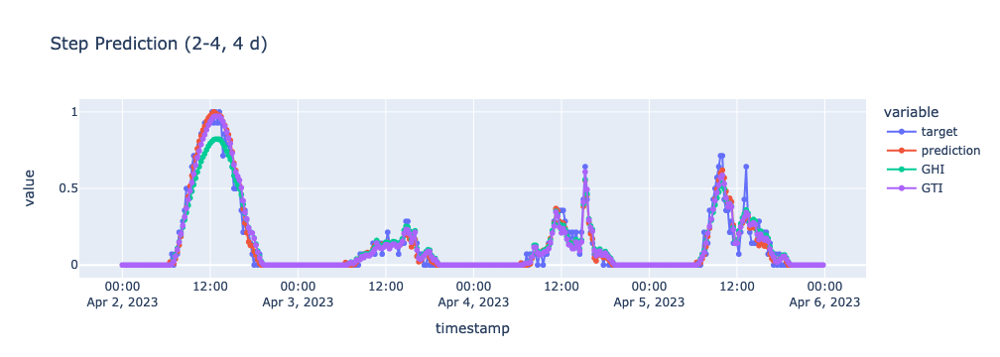

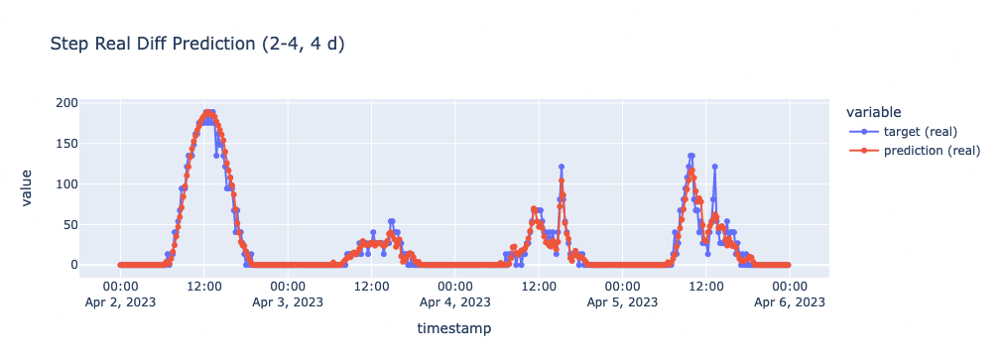

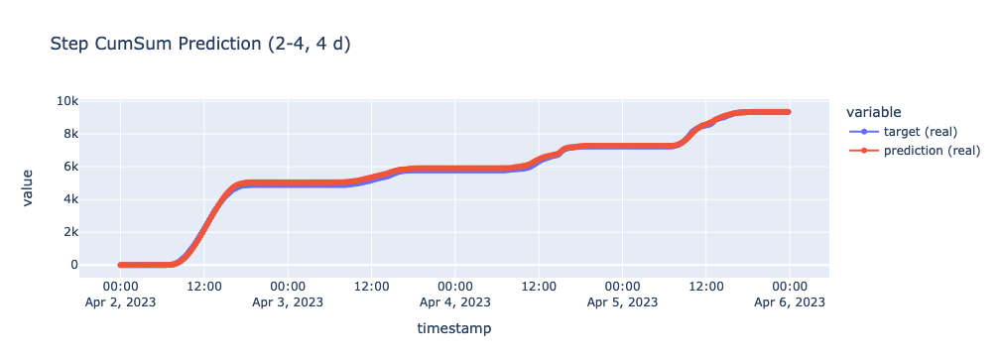

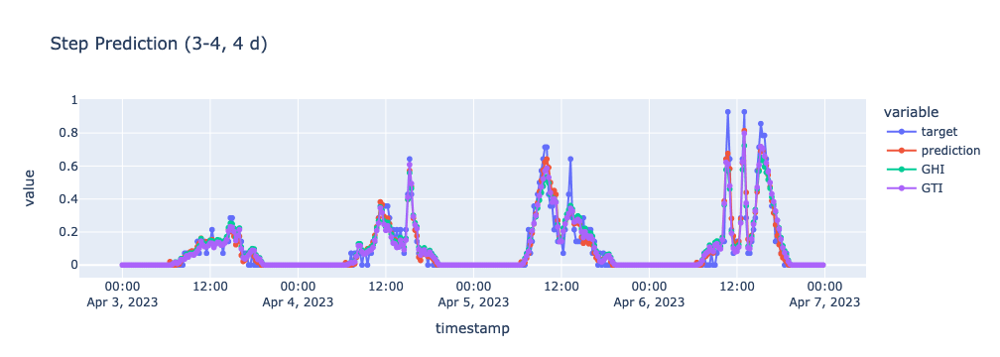

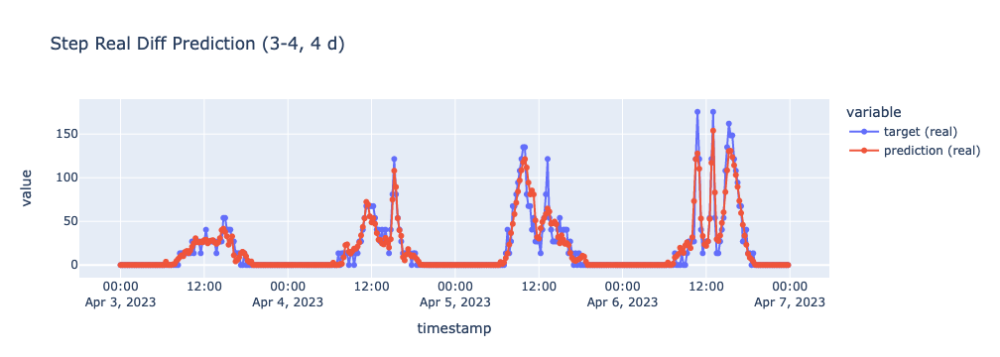

...

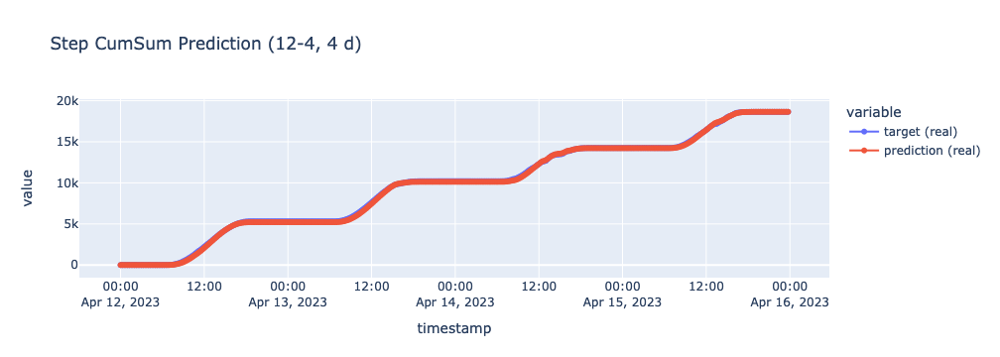

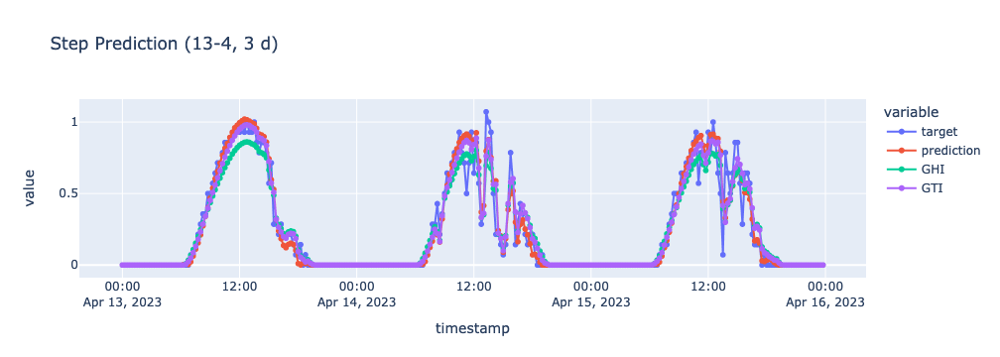

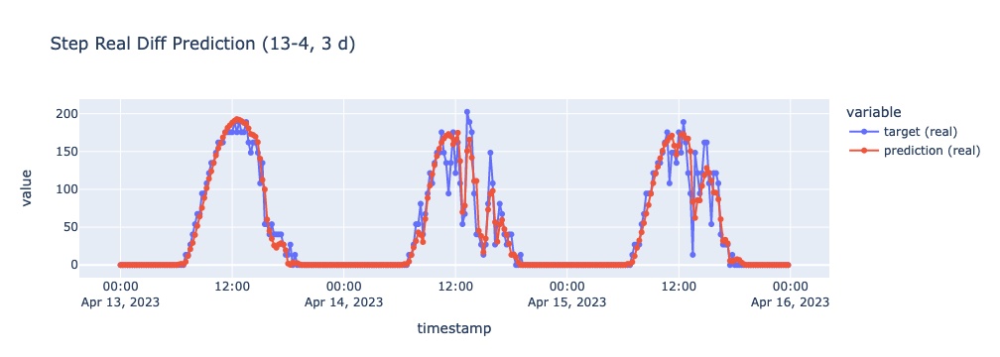

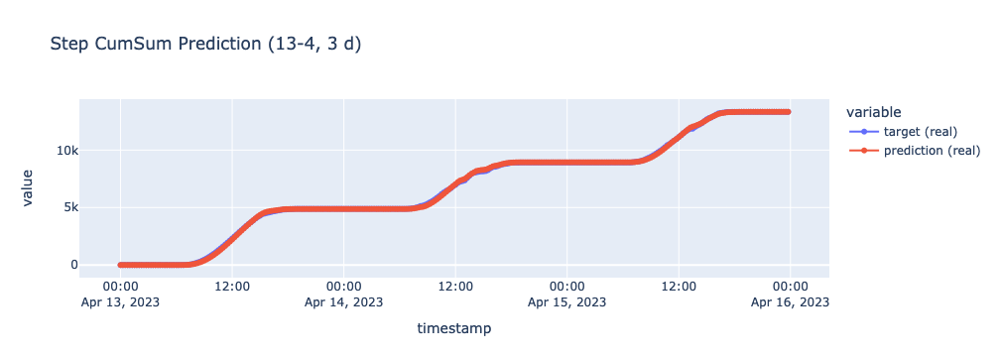

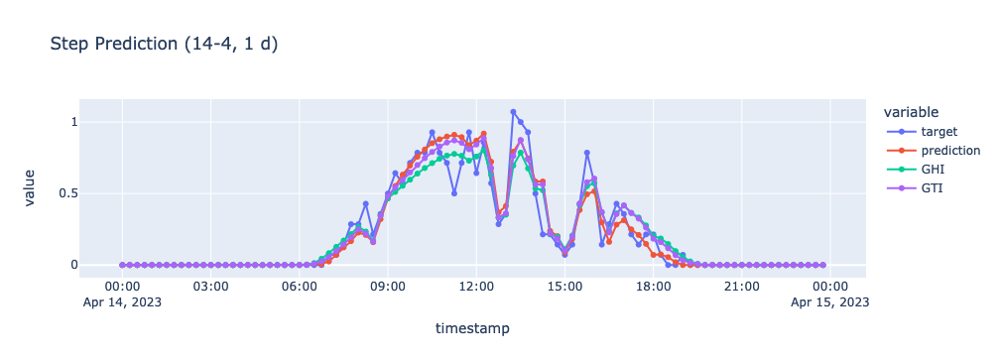

loss,█▇▅▄▄▃▃▃▅▃▄▄▄▅▃▃▄▅▄▂▃▄▄▆▃▂▂▁▂▄▂▂▂▃▃▄▂▂▃▃
val_loss,█▅▅▃▃▃▁▂▂▂▂▂▂▁▂▁▂▂▂▂▂▂▁▂▂▁▂▂▂▁▁▁▁▂▂▂▂▁▂▁
loss,0.02562
val_loss,0.03513


In [11]:
mm.evaluate(
    test_df, train_target_scaler,
    model_path="./models/GRRUN15MIN-TEST2_b10_e100.model"
)